100%|██████████| 170498071/170498071 [00:02<00:00, 75474866.91it/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


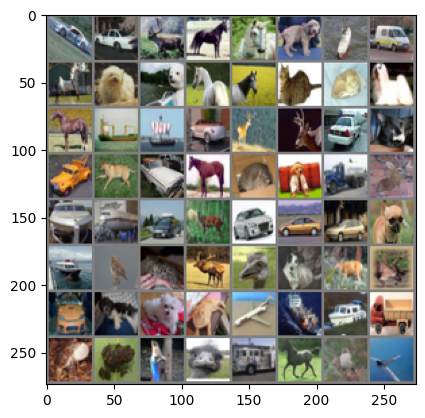

Epoch = 0 === Loss --- 1080.4874355793
Epoch = 1 === Loss --- 740.8344061970711
Epoch = 2 === Loss --- 582.7578281462193
Epoch = 3 === Loss --- 475.88389244675636
Epoch = 4 === Loss --- 381.90940031409264
Epoch = 5 === Loss --- 301.06213735044
Epoch = 6 === Loss --- 224.08757501095533
Epoch = 7 === Loss --- 162.83480946719646
Epoch = 8 === Loss --- 119.13007792457938
Epoch = 9 === Loss --- 91.74112113472074
Epoch = 10 === Loss --- 87.14007354713976
Epoch = 11 === Loss --- 60.919092412572354
Epoch = 12 === Loss --- 73.28757666656747
Epoch = 13 === Loss --- 57.66338940896094
Epoch = 14 === Loss --- 58.38672027015127
Epoch = 15 === Loss --- 52.36223433050327
Epoch = 16 === Loss --- 53.542787447338924
Epoch = 17 === Loss --- 53.09962015063502
Epoch = 18 === Loss --- 46.37147972045932
Epoch = 19 === Loss --- 47.64830791589338
Epoch = 20 === Loss --- 49.14239733153954
Epoch = 21 === Loss --- 39.96549403978861
Epoch = 22 === Loss --- 44.988355687761214
Epoch = 23 === Loss --- 45.4201452162815

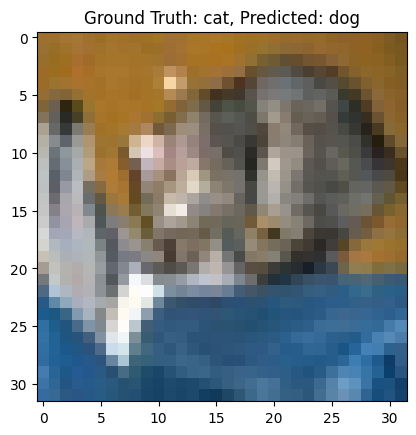

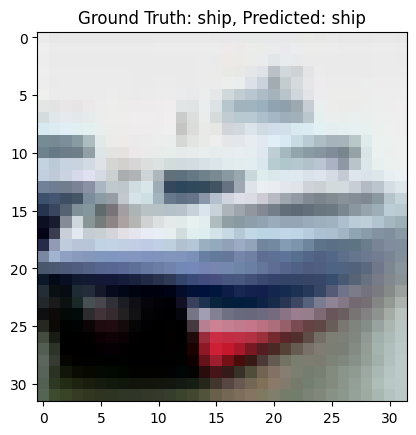

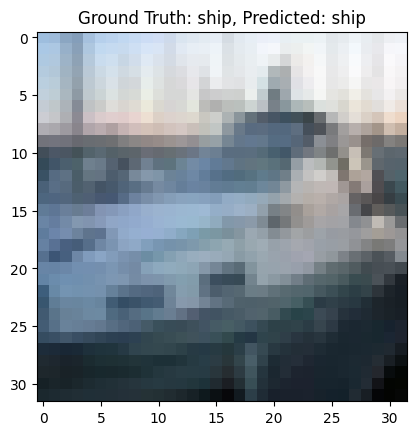

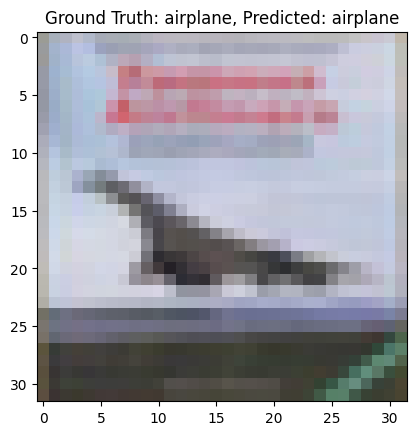

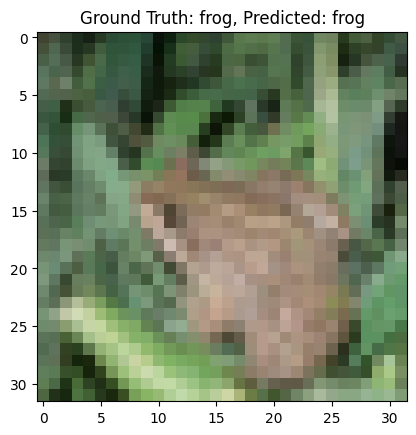

...

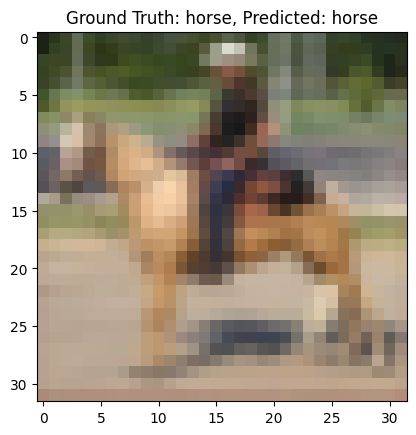

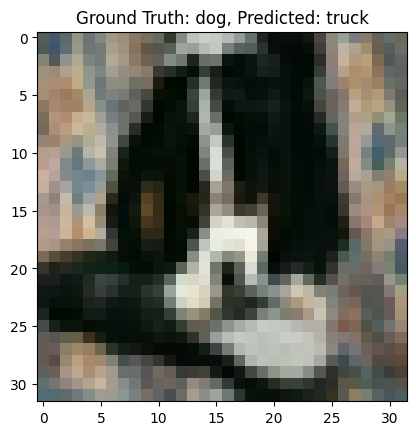

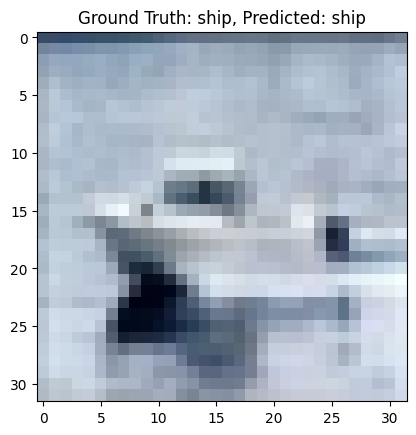

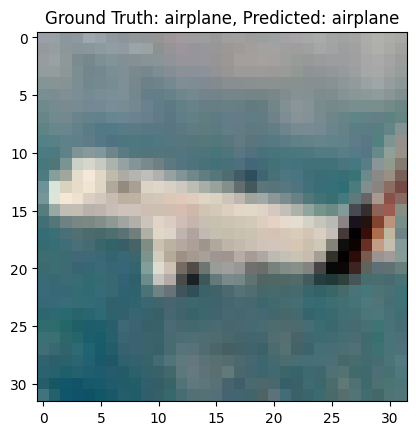

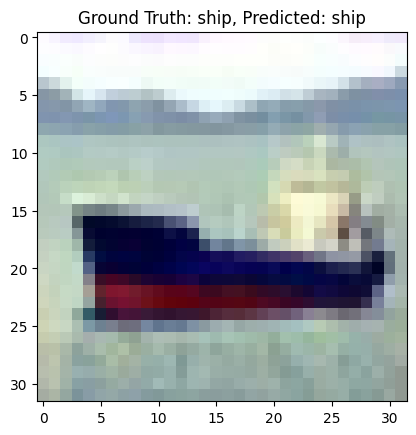

Accuracy of the network on the 10000 test images: 73 %
Accuracy of the network on the 10000 test images: 73 %


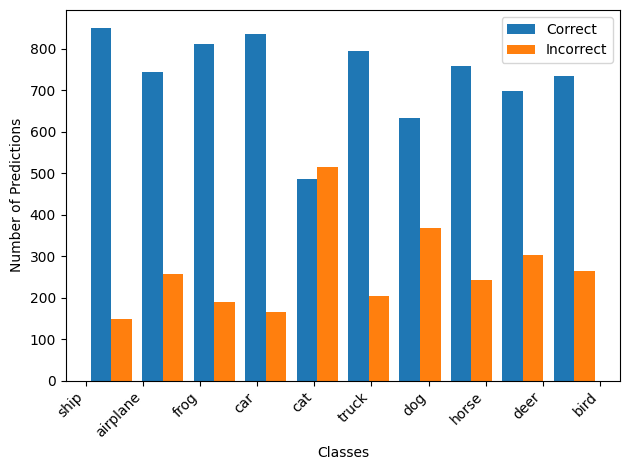

In [ ]:


import torchvision
from torchvision.transforms import transforms
from torch.utils.data import DataLoader,Subset
from torchvision.utils import make_grid
import torch.nn as nn
import torch.nn.functional as F
import torch
import numpy as np # you need to import numpy
import matplotlib.pyplot as plt
import numpy as np
from os import X_OK


transform = transforms.Compose([transforms.ToTensor(), #converting each pixel to 0-1 values
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5,0.5,0.5))])
batch_size = 64
train_dataset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
subset_size = 50000
indicies = np.random.choice(len(train_dataset), subset_size, replace = False)

# Use the Subset class from torch.utils.data to create a subset
train_subdataset = Subset(train_dataset, indicies)
train_dataloader = DataLoader(train_subdataset, batch_size = batch_size, shuffle = True )

test_dataset = torchvision.datasets.CIFAR10(root= './data', train = False, download = True, transform = transform)
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)

classes = ('airplane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck' )
def image_show(images):
  images = images * 0.5 + 0.5
  np_image = images.numpy()
  plt.imshow(np.transpose(np_image, (1,2,0)))
  plt.show()

data_iter = iter(train_dataloader)
images, labels = next(data_iter)
image_show(torchvision.utils.make_grid(images))
class CNN(nn.Module):
  def __init__(self, ):
    super(CNN, self).__init__()

    self.conv1 = nn.Conv2d(in_channels = 3, out_channels = 32, kernel_size =3, stride =1, padding=  1) #dimension of img is in 1st con layer is ?
    self.conv2 = nn.Conv2d(in_channels = 32, out_channels = 64, kernel_size =3, stride =1, padding=  1) #dimension of img is in 2nd con layer is ?
    self.conv3 = nn.Conv2d(in_channels = 64, out_channels = 128, kernel_size =3, stride =1, padding = 1)  #dimension of img is in 3rd con layer is ?
    self.maxpool = nn.MaxPool2d(kernel_size = 2, stride = 2, padding =0)
    self.ffn1 =nn.Linear(in_features= 4 * 4 * 128, out_features = 512, bias = True)
    self.ffn2 =nn.Linear(in_features= 512, out_features = 10, bias = True)

  def forward(self, x):
    x = self.maxpool(F.relu(self.conv1(x)))
    x = self.maxpool(F.relu(self.conv2(x)))
    x = self.maxpool(F.relu(self.conv3(x)))
    x = x.view(-1, 4*4*128)
    x = F.relu(self.ffn1(x))
    x = self.ffn2(x)
    return x


model = CNN()
loss_criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr = 0.001)
model

def train_loop(model, criterion, optimizer, dataloader, num_epochs):
  model.train()
  for epoch in range(num_epochs):
    loss_val = 0
    for images, labels in dataloader:
      output = model(images)
      loss = loss_criterion(output, labels)

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_val += loss.item()
    print(f"Epoch = {epoch} === Loss --- {loss_val}")
train_loop(model, loss_criterion, optimizer, train_dataloader, num_epochs = 60)


def test_loop(model, dataloader):
  model.eval()
  correct = 0
  total = 0
  with torch.no_grad():
    for images, labels in dataloader:
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

      # Show predictions and ground truth for a few samples
      for i in range(min(5, images.size(0))):
        image = images[i]
        label = labels[i]
        pred = predicted[i]
        plt.imshow(np.transpose(image.numpy() * 0.5 + 0.5, (1, 2, 0)))
        plt.title(f"Ground Truth: {classes[label]}, Predicted: {classes[pred]}")
        plt.show()

  print(f"Accuracy of the network on the 10000 test images: {100 * correct // total} %")

test_loop(model, test_dataloader)

def test_loop(model, dataloader):
  model.eval()
  correct = 0
  total = 0
  correct_predictions = []
  incorrect_predictions = []
  with torch.no_grad():
    for images, labels in dataloader:
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      total += labels.size(0)
      correct += (predicted == labels).sum().item()

      # Store predictions for histogram
      for i in range(images.size(0)):
        if predicted[i] == labels[i]:
          correct_predictions.append(classes[labels[i]])
        else:
          incorrect_predictions.append(classes[labels[i]])

  print(f"Accuracy of the network on the 10000 test images: {100 * correct // total} %")

  # Plot histogram
  plt.hist([correct_predictions, incorrect_predictions],
           bins=len(classes), label=['Correct', 'Incorrect'])
  plt.xlabel('Classes')
  plt.ylabel('Number of Predictions')
  plt.xticks(rotation=45, ha='right')
  plt.legend()
  plt.tight_layout()
  plt.show()

test_loop(model, test_dataloader)
